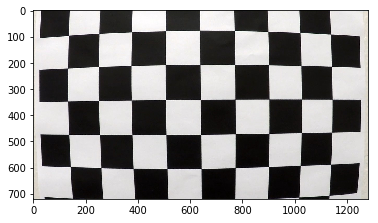

In [20]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

# Read first calibration image
img=mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(img)

# 1. Camera Calibration

On first step we are going to calibrate camera and save distortion coefficients

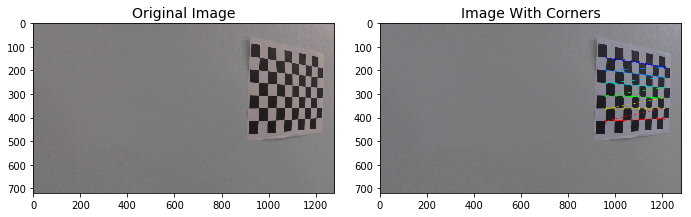

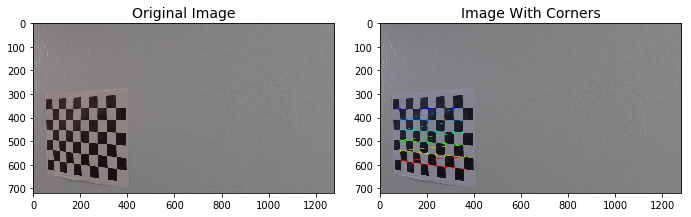

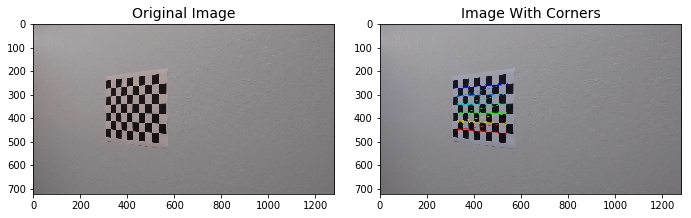

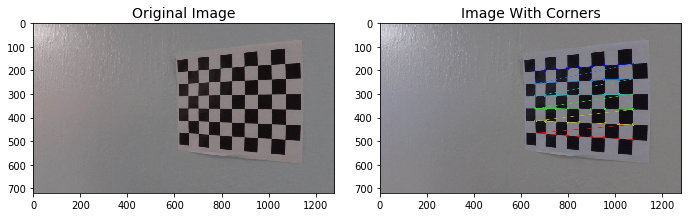

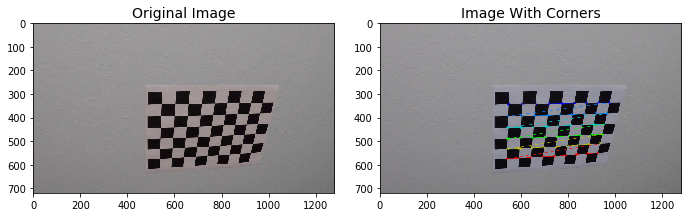

...

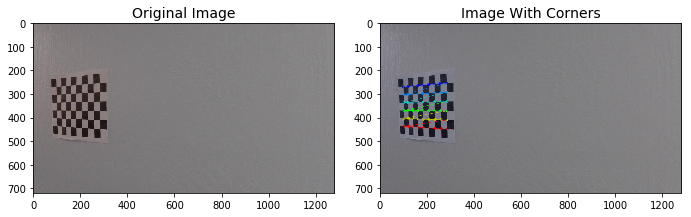

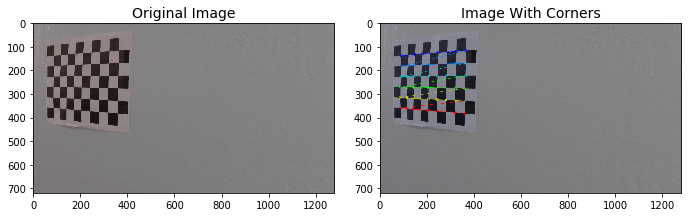

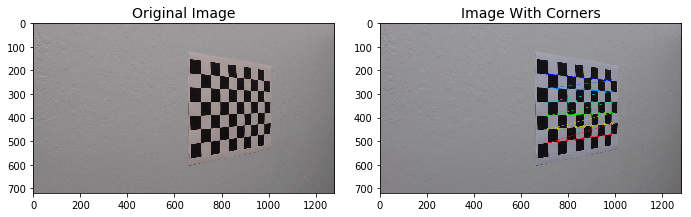

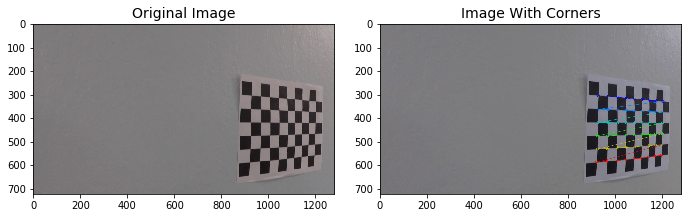

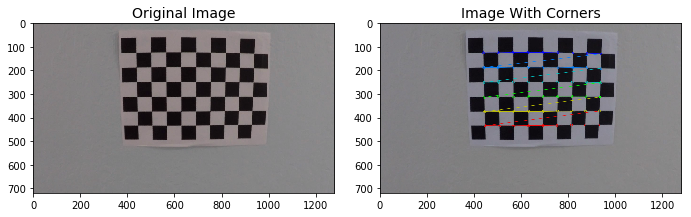

In [21]:
objpoints = [] # 3D points in real world space
imgpoints = [] # 3D points in image plane

nx=9 #number of inside corners in x
ny=6 #number of inside corners in y

# Preparing object points, like (0,0,0),(1,0,0) .....,(7,5,0)  z coordinate is zero
objp=np.zeros((nx*ny,3),np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # for x and y generating coordinates

#Reading all calibration images
images=glob.glob('camera_cal/calibration*.jpg')

for fname in images:
    #read each image
    img=mpimg.imread(fname)

    #Converting image to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners=cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # If found corners, add image points and object points
    if ret==True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        #draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=14)
        ax2.imshow(img)
        ax2.set_title('Image With Corners', fontsize=14)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        mpimg.imsave("output_images/"+fname.split('/')[1],img)




Next we are going to calibrate camera and undistort images

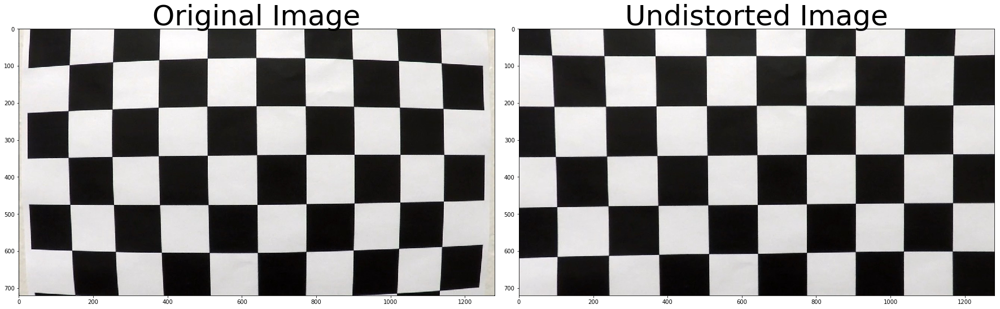

In [22]:
# performs camera calibration and image distortion correction
def undistort_image(img, objpoints, imgpoints):
    #Converting image to grayscale
    gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #Calibrating camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    #image distortion correction
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


img=mpimg.imread('camera_cal/calibration1.jpg')
undistorted = undistort_image(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# 2. Perspective Transform

here  we are doing perspective transform to warp image

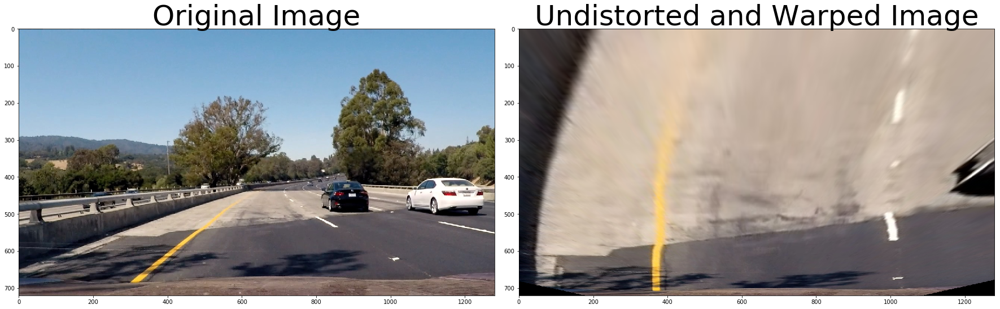

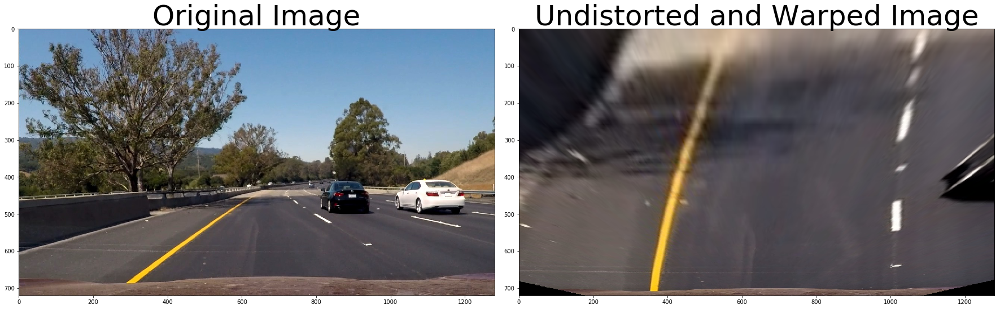

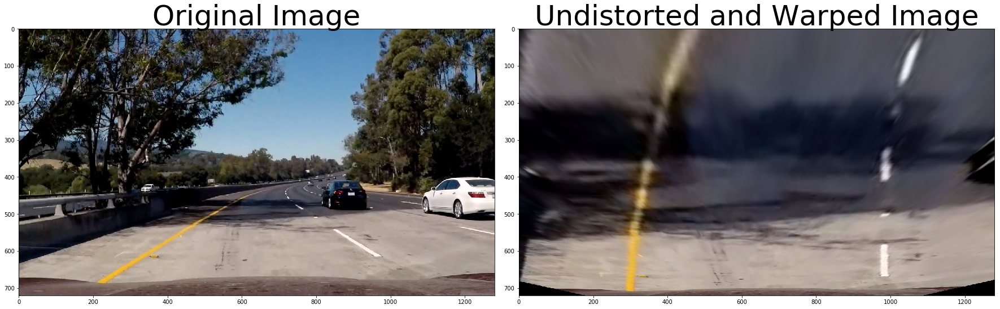

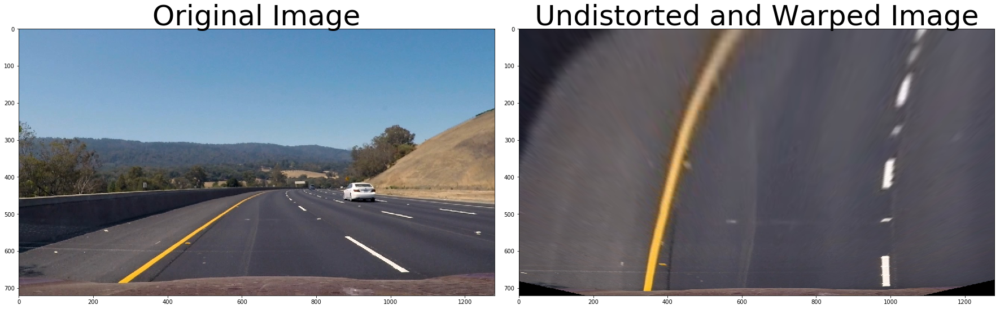

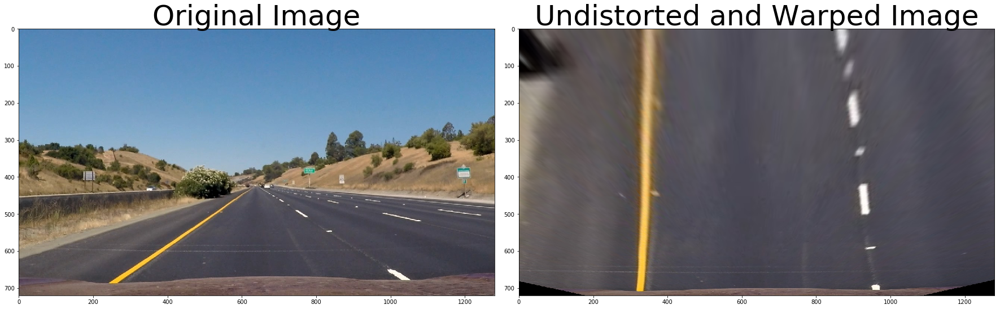

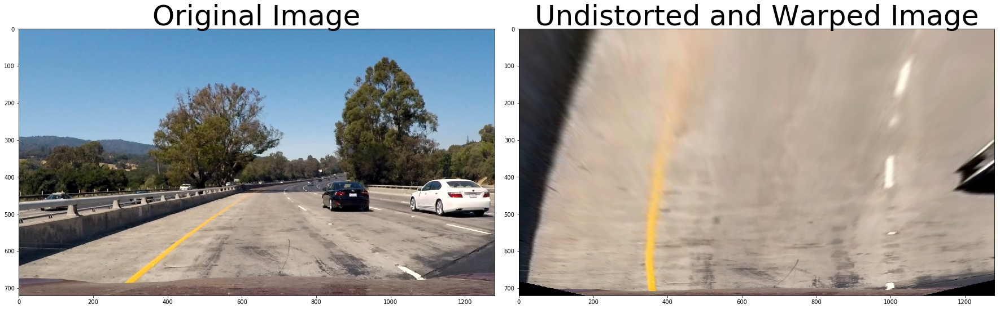

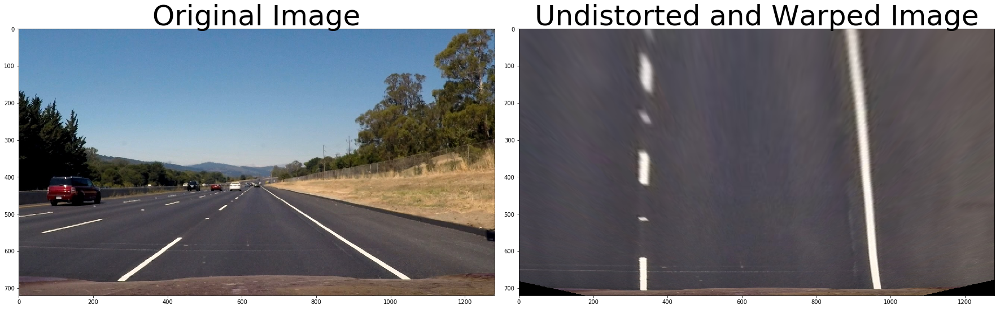

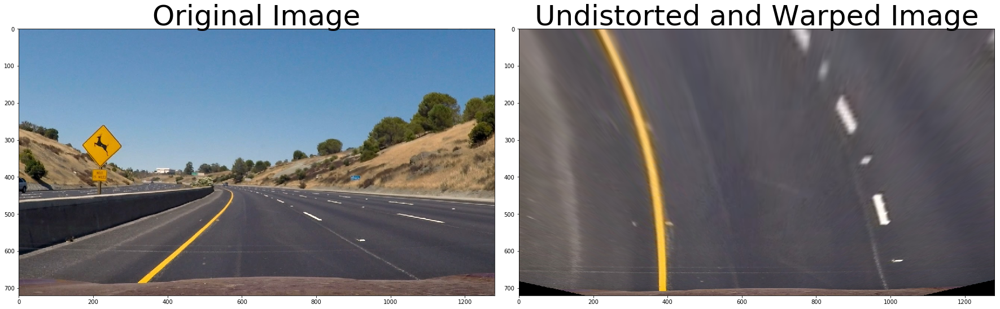

In [23]:
#Doing perspective transform
def perspective_transform(img, nx,ny,objpoints, imgpoints):
    #undistorting image
    undist=undistort_image(img,objpoints, imgpoints)
    #source points were taken from straight_lines1.jpg image 
    src=np.float32([[190,720],[1105, 720],[590, 450],[700, 450]])
    #destination points
    dst=np.float32([[315,720],[960,720],[315,0],[960,0]])
    #perspective transform
    M = cv2.getPerspectiveTransform(src, dst)
    #invariant of perspective transform
    Minv=cv2.getPerspectiveTransform(dst, src)
    img_size=(img.shape[1],img.shape[0])
    #warpening corners
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv


for image in glob.glob('test_images/*.jpg'):
    top_down, perspective_M, Minv = perspective_transform(mpimg.imread(image), nx, ny, objpoints, imgpoints)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(mpimg.imread(image))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down)
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    mpimg.imsave("output_images/Undistorted_"+image.split('/')[1],top_down)

# 3. Gradient Threshold

here applying binary threshold

In [24]:
def abs_sobel_thresh(img, orient='x',sobel_kernel=3, thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def threshold_image(img):
    # Sobel kernel size
    ksize = 3 
    # Gaussian Blur
    img = cv2.GaussianBlur(img, (7, 7), 0)
    
    #sobel threshold in x direction
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 200))
    #sobel threshold in y direction
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 200))
    
    #magnitude of gradient
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(0, 255))
    #direction of gradient
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(np.pi/6, np.pi/2))  
    combined = np.zeros_like(dir_binary)
    #combining all thresholds
    combined[((grady == 1) & (gradx == 1) & (mag_binary == 1) & (dir_binary == 1))] = 1
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
   
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])
    
    color_combined = np.zeros_like(S)
    #combining thresholds
    color_combined[((l_condition==1) & (s_condition==1) | (combined==1))] = 1
    
    return color_combined
    


Below is example of Thresholded image

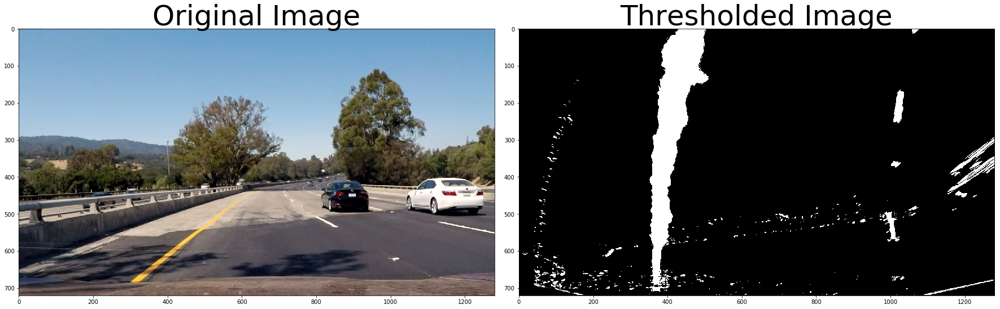

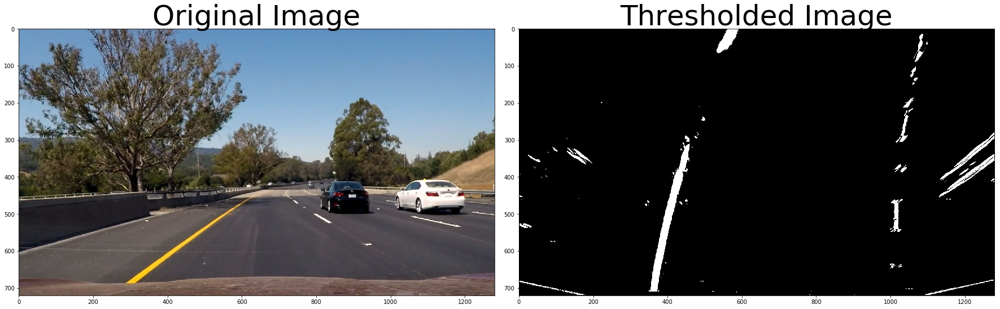

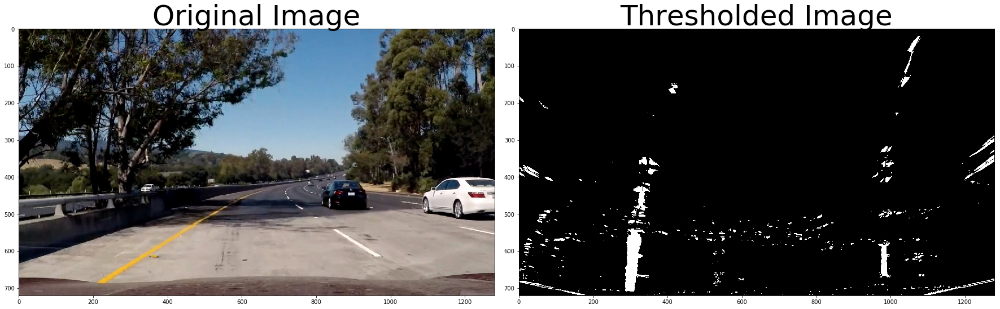

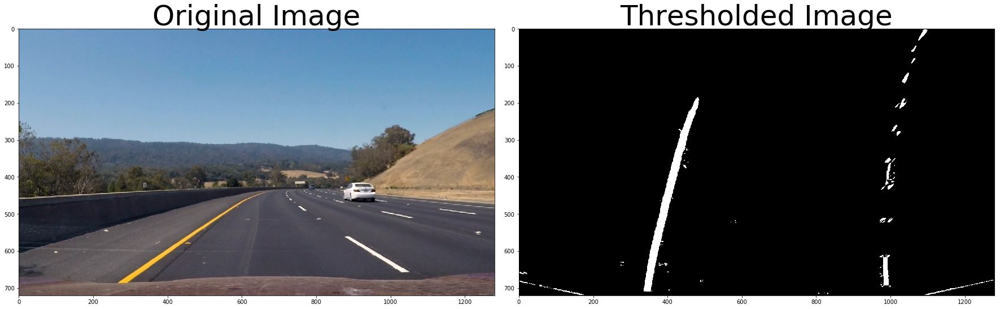

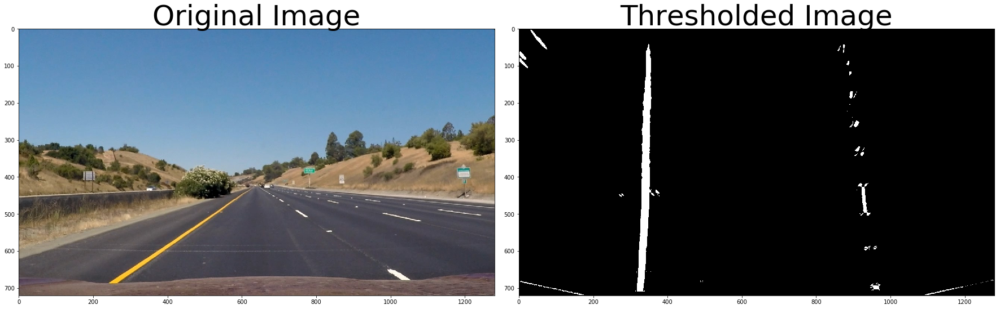

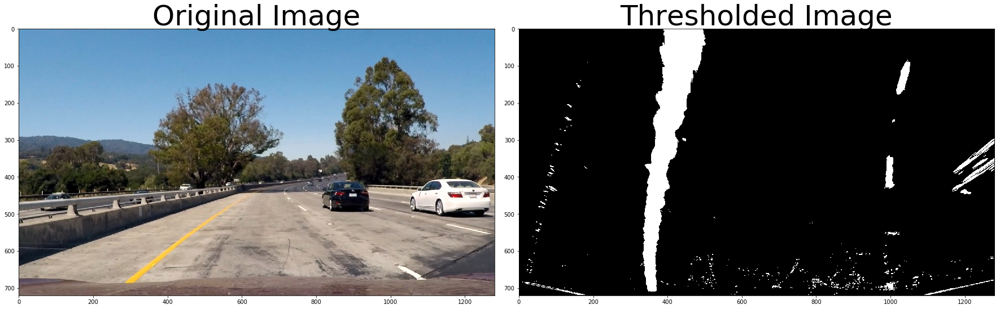

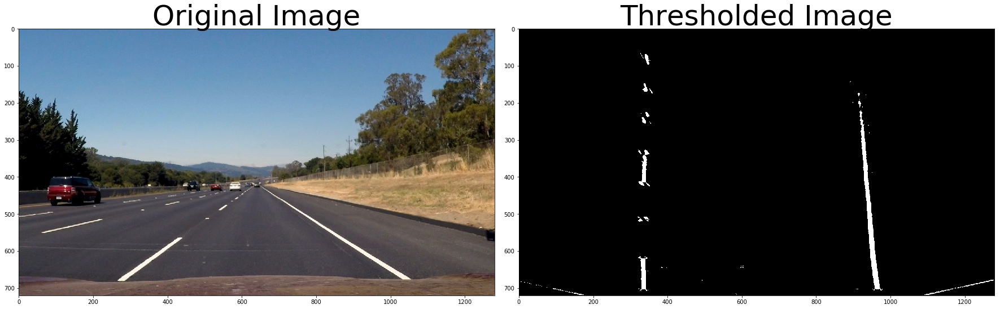

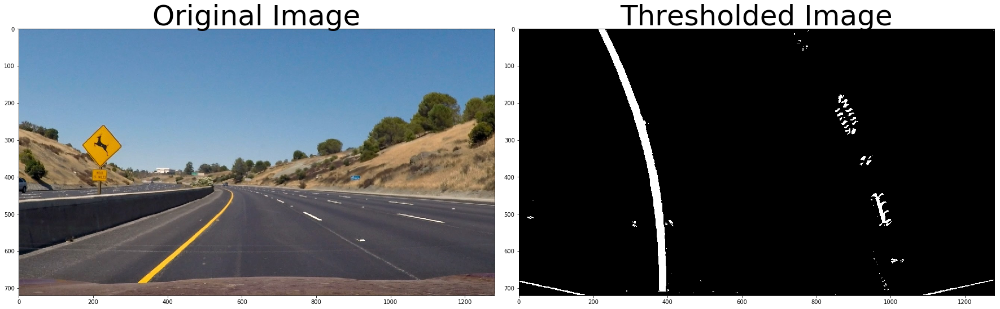

In [25]:
for image in glob.glob('test_images/*.jpg'):
    img = mpimg.imread(image)
    transformed,_,_ = perspective_transform(img,nx,ny, objpoints, imgpoints)
    thresholded=threshold_image(transformed)
    # Plot the 2 images side by side
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    mpimg.imsave("output_images/Thresholded_"+image.split('/')[1],thresholded)

# 4. Finding lane lines

Peaks in Histogram


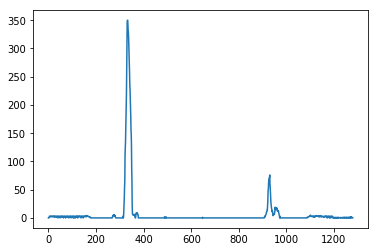

In [26]:
img = mpimg.imread('test_images/straight_lines1.jpg')
transformed,M,Minv = perspective_transform(img,nx,ny, objpoints, imgpoints)
thresholded=threshold_image(transformed)

histogram = np.sum(thresholded[thresholded.shape[0]//2:,:], axis=0)
plt.plot(histogram)

Implementing sliding window

In [27]:
from collections import deque

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=8)
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])] 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def update(self, x, y, currentfit, fitx, radius, distance):
        self.detected = True
        self.allx = x
        self.ally = y
        self.current_fit = currentfit
        self.recent_xfitted.append(fitx)
        self.radius_of_curvature = radius
        self.line_base_pos = distance
        self.bestx = np.mean(self.recent_xfitted, axis=0)

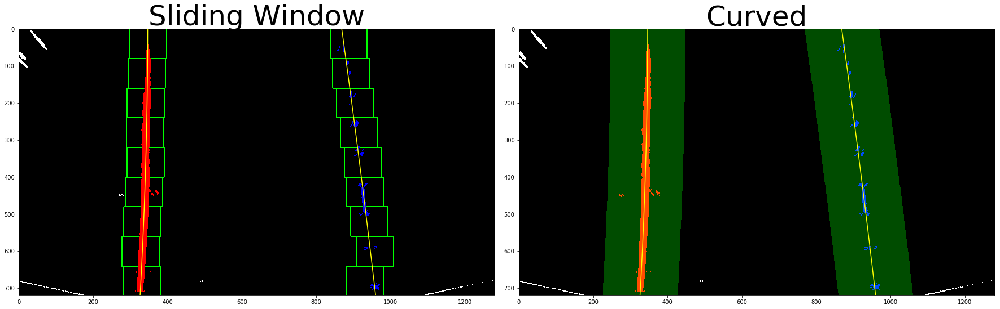

In [28]:
#Implemented using code from Udacity lessons
def sliding_window(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 1
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    if not left_line.detected or not right_line.detected:
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    else:
        left_fit=left_line.current_fit
        right_fit=right_line.current_fit
        left_lane_inds = ((nonzerox >(left_fit[0]*(nonzeroy**2) +left_fit[1]*nonzeroy +left_fit[2] - margin)) &
        (nonzerox <(left_fit[0]*(nonzeroy**2) +left_fit[1]*nonzeroy +left_fit[2] + margin)))
        right_lane_inds = ((nonzerox >(right_fit[0]*(nonzeroy**2) +right_fit[1]*nonzeroy +right_fit[2] - margin)) &
        (nonzerox <(right_fit[0]*(nonzeroy**2) +right_fit[1]*nonzeroy +right_fit[2] + margin)))
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_line.update(leftx, lefty, left_fit, left_fitx, 0, 0)
    right_line.update(rightx, righty, right_fit, right_fitx, 0, 0)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return out_img, ploty

#Implemented using code from Udacity lessons
def sliding_window1(img,left_fit,right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fitx, right_fitx, leftx,lefty, rightx, righty

left_line = Line()
right_line = Line()    
img = mpimg.imread('test_images/straight_lines1.jpg')
transformed,M,Minv = perspective_transform(img,nx,ny, objpoints, imgpoints)
binary_warped=threshold_image(transformed)
out_img,ploty=sliding_window(binary_warped)

result, left_fitx, right_fitx, leftx,lefty, rightx, righty=sliding_window1(binary_warped,left_line.current_fit,right_line.current_fit)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(out_img)
ax1.set_title('Sliding Window', fontsize=50)
ax1.plot(left_fitx, ploty, color='yellow')
ax1.plot(right_fitx, ploty, color='yellow')

ax2.imshow(result, cmap='gray')
ax2.set_title('Curved', fontsize=50)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


# 5. Measuring Curvature

In [29]:
#Implemented using code from Udacity lessons
def measure_curvature_and_distance_from_center(img):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    leftx=left_line.allx
    lefty=left_line.ally
    rightx=right_line.allx
    righty=right_line.ally
    
    left_fit=left_line.current_fit
    right_fit=right_line.current_fit
    
    ploty=ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    left_line.radius_of_curvature = left_curverad
    right_line.radius_of_curvature = right_curverad
        
    car_pos=img.shape[1]/2
    left=left_fit[0]*img.shape[0]**2 + left_fit[1]*img.shape[0] + left_fit[2]
    right = right_fit[0]*img.shape[0]**2 + right_fit[1]*img.shape[0] + right_fit[2]
    center_pos=(left+right)/2
    center=(car_pos - center_pos) * xm_per_pix
    return left_curverad, right_curverad,center

left_curverad, right_curverad, dist=measure_curvature_and_distance_from_center(img)
print(left_curverad, 'm', right_curverad, 'm', dist,'m')

3557.69547227 m 10410.3016781 m -0.0155908229251 m


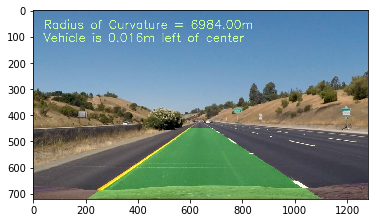

In [30]:
#Implemented using code from Udacity lessons
def draw_curvature_and_data(img,warped, radius, distance,Minv):
    new_img = np.copy(img)
    h,v = new_img.shape[0],new_img.shape[1]
    
    left_fit=left_line.current_fit
    right_fit=right_line.current_fit
    if left_fit is not None and right_fit is not None:
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        ploty = np.linspace(0, h-1, num=h)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
        new_img = np.copy(result)
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Radius of Curvature = ' + '{:04.2f}'.format(radius) + 'm'
    cv2.putText(new_img, text, (40,70),font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if distance > 0:
        direction = 'right'
    elif distance < 0:
        direction = 'left'
    text = 'Vehicle is {:04.3f}'.format(abs(distance)) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120),font,  1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

left_line = Line()
right_line = Line()  
img = mpimg.imread('test_images/straight_lines1.jpg')
transformed,M,Minv = perspective_transform(img,nx,ny, objpoints, imgpoints)
binary_warped=threshold_image(transformed)

out_img, ploty=sliding_window(binary_warped)
left_curverad, right_curverad, dist=measure_curvature_and_distance_from_center(binary_warped)
return_image=draw_curvature_and_data(img,binary_warped, (left_curverad+right_curverad)/2, dist,Minv)
plt.imshow(return_image)


# 6. Tracking

In [15]:
def final_pipeline(test_img):
    transformed,M,Minv = perspective_transform(test_img,nx,ny, objpoints, imgpoints)
    n_img=threshold_image(transformed)
    out_img ,ploty=sliding_window(n_img)
    left_curverad, right_curverad, dist=measure_curvature_and_distance_from_center(n_img)
    return_image=draw_curvature_and_data(test_img,binary_warped, (left_curverad+right_curverad)/2, dist,Minv)
    return return_image
       

# Video Analysis

In [16]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
left_line = Line()
right_line = Line()
output = 'project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
new_clip = clip.fl_image(final_pipeline)
%time new_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [11:27<00:00,  1.89it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 9min 12s, sys: 3.4 s, total: 9min 15s
Wall time: 11min 30s


In [17]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

# Harder Chalenge Video Analysis

In [18]:
left_line = Line()
right_line = Line()
output1 = 'harder_challenge_video_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
new_clip1 = clip1.fl_image(final_pipeline)
%time new_clip1.write_videofile(output1, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [11:17<00:00,  1.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 8min 40s, sys: 3.13 s, total: 8min 43s
Wall time: 11min 21s


In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output1))